## Exploratory Data Analysis

In [1]:
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import figure
import warnings
warnings.filterwarnings('ignore')
import statsmodels.api as sm
from scipy.stats import norm
from scipy.stats import t
import plotly.express as px
import scipy.stats as stats

### About the project and Problem Statement

#### About Yulu

Yulu is India’s leading micro-mobility service provider, which offers unique vehicles for the daily commute. Starting off as a mission to eliminate traffic congestion in India, Yulu provides the safest commute solution through a user-friendly mobile app to enable shared, solo and sustainable commuting.

Yulu zones are located at all the appropriate locations (including metro stations, bus stands, office spaces, residential areas, corporate offices, etc) to make those first and last miles smooth, affordable, and convenient!

Yulu has recently suffered considerable dips in its revenues. They have contracted a consulting company to understand the factors on which the demand for these shared electric cycles depends. Specifically, they want to understand the factors affecting the demand for these shared electric cycles in the Indian market.

#### How you can help here?

The company wants to know:

Which variables are significant in predicting the demand for shared electric cycles in the Indian market?
How well those variables describe the electric cycle demands

#### Column Profiling:

- datetime: datetime
- season: season (1: spring, 2: summer, 3: fall, 4: winter)
- holiday: whether day is a holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
- workingday: if day is neither weekend nor holiday is 1, otherwise is 0.
weather:
    - 1: Clear, Few clouds, partly cloudy, partly cloudy
    - 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
    - 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
    - 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
- temp: temperature in Celsius
- atemp: feeling temperature in Celsius
- humidity: humidity
- windspeed: wind speed
- casual: count of casual users
- registered: count of registered users
- count: count of total rental bikes including both casual and registered

In [2]:
data=pd.read_csv(r'C:\Users\Sweta.Singh\Downloads\bike_sharing.csv')

In [3]:
data.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0,8,32,40
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0,5,27,32
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0,3,10,13
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0,0,1,1


In [4]:
copy_data=data.copy()

#### shape of the data

In [5]:
copy_data.shape

(10886, 12)

In [6]:
copy_data.head(10)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0000,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0000,8,32,40
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0000,5,27,32
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0000,3,10,13
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0000,0,1,1
5,2011-01-01 05:00:00,1,0,0,2,9.84,12.880,75,6.0032,0,1,1
6,2011-01-01 06:00:00,1,0,0,1,9.02,13.635,80,0.0000,2,0,2
7,2011-01-01 07:00:00,1,0,0,1,8.20,12.880,86,0.0000,1,2,3
8,2011-01-01 08:00:00,1,0,0,1,9.84,14.395,75,0.0000,1,7,8
9,2011-01-01 09:00:00,1,0,0,1,13.12,17.425,76,0.0000,8,6,14


- We can see that Data is recorded per hour. 24 hr clock
- 10886 Records of bike Rented (each record shows how many bikes were rented during that hour of the day.)

In [7]:
copy_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    10886 non-null  object 
 1   season      10886 non-null  int64  
 2   holiday     10886 non-null  int64  
 3   workingday  10886 non-null  int64  
 4   weather     10886 non-null  int64  
 5   temp        10886 non-null  float64
 6   atemp       10886 non-null  float64
 7   humidity    10886 non-null  int64  
 8   windspeed   10886 non-null  float64
 9   casual      10886 non-null  int64  
 10  registered  10886 non-null  int64  
 11  count       10886 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.7+ KB


- We don't have null in any feature

In [8]:
copy_data.isna().sum()

datetime      0
season        0
holiday       0
workingday    0
weather       0
temp          0
atemp         0
humidity      0
windspeed     0
casual        0
registered    0
count         0
dtype: int64

- There are no missing values present in the dataset.

In [9]:
copy_data.columns

Index(['datetime', 'season', 'holiday', 'workingday', 'weather', 'temp',
       'atemp', 'humidity', 'windspeed', 'casual', 'registered', 'count'],
      dtype='object')

#### unique values per columns

In [10]:
copy_data.nunique()

datetime      10886
season            4
holiday           2
workingday        2
weather           4
temp             49
atemp            60
humidity         89
windspeed        28
casual          309
registered      731
count           822
dtype: int64

In [11]:
copy_data.describe()

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
count,10886.000000,10886.000000,10886.000000,10886.000000,10886.00000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000
mean,2.506614,0.028569,0.680875,1.418427,20.23086,23.655084,61.886460,12.799395,36.021955,155.552177,191.574132
std,1.116174,0.166599,0.466159,0.633839,7.79159,8.474601,19.245033,8.164537,49.960477,151.039033,181.144454
min,1.000000,0.000000,0.000000,1.000000,0.82000,0.760000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2.000000,0.000000,0.000000,1.000000,13.94000,16.665000,47.000000,7.001500,4.000000,36.000000,42.000000
50%,3.000000,0.000000,1.000000,1.000000,20.50000,24.240000,62.000000,12.998000,17.000000,118.000000,145.000000
75%,4.000000,0.000000,1.000000,2.000000,26.24000,31.060000,77.000000,16.997900,49.000000,222.000000,284.000000
max,4.000000,1.000000,1.000000,4.000000,41.00000,45.455000,100.000000,56.996900,367.000000,886.000000,977.000000


Season, Holiday,workingday, weather are Categorical Variables

In [12]:
copy_data.describe(include=object)

,datetime
count,10886
unique,10886
top,2011-01-01 00:00:00
freq,1


In [13]:
categorical_variables=['season', 'holiday', 'workingday','weather']
for i in categorical_variables:
    print('unique values in {0} are {1}'.format(i,copy_data[i].unique()))

unique values in season are [1 2 3 4]
unique values in holiday are [0 1]
unique values in workingday are [0 1]
unique values in weather are [1 2 3 4]


In [14]:
# copy_data['datetime'] = pd.to_datetime(copy_data['datetime'])

cat_cols= ['season', 'holiday', 'workingday', 'weather']
for col in cat_cols:
    copy_data[col] = copy_data[col].astype('object')

In [15]:
copy_data.iloc[:,1:].describe(include='all')

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
count,10886.0,10886.0,10886.0,10886.0,10886.00000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000
unique,4.0,2.0,2.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,4.0,0.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,2734.0,10575.0,7412.0,7192.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,20.23086,23.655084,61.886460,12.799395,36.021955,155.552177,191.574132
std,NaN,NaN,NaN,NaN,7.79159,8.474601,19.245033,8.164537,49.960477,151.039033,181.144454
min,NaN,NaN,NaN,NaN,0.82000,0.760000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,NaN,NaN,NaN,NaN,13.94000,16.665000,47.000000,7.001500,4.000000,36.000000,42.000000
50%,NaN,NaN,NaN,NaN,20.50000,24.240000,62.000000,12.998000,17.000000,118.000000,145.000000
75%,NaN,NaN,NaN,NaN,26.24000,31.060000,77.000000,16.997900,49.000000,222.000000,284.000000


- There are no missing values in the dataset.
- casual and registered attributes might have outliers because their mean and median are very far away to one another and the value of standard deviation is also high which tells us that there is high variance in the data of these attributes.

In [16]:
# minimum datetime and maximum datetime
copy_data['datetime'].min(), copy_data['datetime'].max()

('2011-01-01 00:00:00', '2012-12-19 23:00:00')

In [17]:
# number of unique values in each categorical columns
copy_data[cat_cols].melt().groupby(['variable', 'value'])[['value']].count()

value
variable   value       
holiday    0      10575
           1        311
season     1       2686
           2       2733
           3       2733
           4       2734
weather    1       7192
           2       2834
           3        859
           4          1
workingday 0       3474
           1       7412

## Pre-processing data:

In [18]:
copy_data["weather"].replace({1:"Clear",
                             2:"Cloudy",
                             3:"Little Rain",
                             4:"Heavy Rain"}, inplace=True)

In [19]:
copy_data.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,Clear,9.84,14.395,81,0.0,3,13,16
1,2011-01-01 01:00:00,1,0,0,Clear,9.02,13.635,80,0.0,8,32,40
2,2011-01-01 02:00:00,1,0,0,Clear,9.02,13.635,80,0.0,5,27,32
3,2011-01-01 03:00:00,1,0,0,Clear,9.84,14.395,75,0.0,3,10,13
4,2011-01-01 04:00:00,1,0,0,Clear,9.84,14.395,75,0.0,0,1,1


In [20]:
copy_data["season"].replace({1:"Spring",
                       2:"Summer",
                       3:"Fall",
                       4:"Winter"},inplace=True)

In [21]:
copy_data.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,Spring,0,0,Clear,9.84,14.395,81,0.0,3,13,16
1,2011-01-01 01:00:00,Spring,0,0,Clear,9.02,13.635,80,0.0,8,32,40
2,2011-01-01 02:00:00,Spring,0,0,Clear,9.02,13.635,80,0.0,5,27,32
3,2011-01-01 03:00:00,Spring,0,0,Clear,9.84,14.395,75,0.0,3,10,13
4,2011-01-01 04:00:00,Spring,0,0,Clear,9.84,14.395,75,0.0,0,1,1


In [22]:
copy_data["workingday"].replace({1:"Yes",
                           0:"No"},inplace=True)

In [23]:
copy_data['datetime'] = pd.to_datetime(copy_data['datetime'])

In [24]:
copy_data["datetime"] = pd.to_datetime(data["datetime"])
copy_data["holiday"].replace({1:"Yes",
                           0:"No"},inplace=True)
copy_data["day"]=copy_data["datetime"].dt.day_name()
copy_data["date"] = copy_data["datetime"].dt.date
copy_data["hour"] = copy_data["datetime"].dt.hour
copy_data["Month"] = copy_data["datetime"].dt.month
copy_data["Month_name"] = copy_data["datetime"].dt.month_name()
copy_data["year"] = copy_data["datetime"].dt.year

In [25]:
copy_data.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,day,date,hour,Month,Month_name,year
0,2011-01-01 00:00:00,Spring,No,No,Clear,9.84,14.395,81,0.0,3,13,16,Saturday,2011-01-01,0,1,January,2011
1,2011-01-01 01:00:00,Spring,No,No,Clear,9.02,13.635,80,0.0,8,32,40,Saturday,2011-01-01,1,1,January,2011
2,2011-01-01 02:00:00,Spring,No,No,Clear,9.02,13.635,80,0.0,5,27,32,Saturday,2011-01-01,2,1,January,2011
3,2011-01-01 03:00:00,Spring,No,No,Clear,9.84,14.395,75,0.0,3,10,13,Saturday,2011-01-01,3,1,January,2011
4,2011-01-01 04:00:00,Spring,No,No,Clear,9.84,14.395,75,0.0,0,1,1,Saturday,2011-01-01,4,1,January,2011


### Describing Statistical summary of Independent Numerical Features :
###### Categorising Temperature And Humidity Levels and Windspeed column data :

In [26]:
pd.DataFrame(copy_data["atemp"].describe()).T

,count,mean,std,min,25%,50%,75%,max
atemp,10886.0,23.655084,8.474601,0.76,16.665,24.24,31.06,45.455


In [27]:
def get_temp(temp):
    if temp <= 12 : return "very low"
    elif temp > 12 and temp < 24 : return "low"
    elif temp >= 24  and temp < 35 :  return "moderate"
    elif temp >= 35 : return "high"

In [28]:
copy_data["temperature"]=pd.Series(map(get_temp,data["atemp"]))

In [29]:
copy_data.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,day,date,hour,Month,Month_name,year,temperature
0,2011-01-01 00:00:00,Spring,No,No,Clear,9.84,14.395,81,0.0,3,13,16,Saturday,2011-01-01,0,1,January,2011,low
1,2011-01-01 01:00:00,Spring,No,No,Clear,9.02,13.635,80,0.0,8,32,40,Saturday,2011-01-01,1,1,January,2011,low
2,2011-01-01 02:00:00,Spring,No,No,Clear,9.02,13.635,80,0.0,5,27,32,Saturday,2011-01-01,2,1,January,2011,low
3,2011-01-01 03:00:00,Spring,No,No,Clear,9.84,14.395,75,0.0,3,10,13,Saturday,2011-01-01,3,1,January,2011,low
4,2011-01-01 04:00:00,Spring,No,No,Clear,9.84,14.395,75,0.0,0,1,1,Saturday,2011-01-01,4,1,January,2011,low


In [30]:
pd.DataFrame(data["humidity"].describe()).T

,count,mean,std,min,25%,50%,75%,max
humidity,10886.0,61.88646,19.245033,0.0,47.0,62.0,77.0,100.0


In [31]:
def get_humidity(H):
    if 0 <= H <= 10:
        return "10%"
    elif 11 <= H <= 20:
        return "20%"
    elif 21 <= H <= 30:
        return "30%"
    elif 31 <= H <= 40:
        return "40%"
    elif 41 <= H <= 50:
        return "50%"
    elif 51 <= H <= 60:
        return "60%"
    elif 61 <= H <= 70:
        return "70%"
    elif 71 <= H <= 80:
        return "80%"
    elif 81 <= H <= 90:
        return "90%"
    elif 91 <= H <= 100:
        return "100%"

In [32]:
copy_data["gethumidity"]=pd.Series(map(get_humidity,copy_data["humidity"]))

In [33]:
pd.DataFrame(data["windspeed"].describe()).T

,count,mean,std,min,25%,50%,75%,max
windspeed,10886.0,12.799395,8.164537,0.0,7.0015,12.998,16.9979,56.9969


In [34]:
copy_data['windspeed_category']=pd.qcut(data["windspeed"],8)

In [35]:
copy_data.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,...,count,day,date,hour,Month,Month_name,year,temperature,gethumidity,windspeed_category
0,2011-01-01 00:00:00,Spring,No,No,Clear,9.84,14.395,81,0.0,3,...,16,Saturday,2011-01-01,0,1,January,2011,low,90%,"(-0.001, 6.003]"
1,2011-01-01 01:00:00,Spring,No,No,Clear,9.02,13.635,80,0.0,8,...,40,Saturday,2011-01-01,1,1,January,2011,low,80%,"(-0.001, 6.003]"
2,2011-01-01 02:00:00,Spring,No,No,Clear,9.02,13.635,80,0.0,5,...,32,Saturday,2011-01-01,2,1,January,2011,low,80%,"(-0.001, 6.003]"
3,2011-01-01 03:00:00,Spring,No,No,Clear,9.84,14.395,75,0.0,3,...,13,Saturday,2011-01-01,3,1,January,2011,low,80%,"(-0.001, 6.003]"
4,2011-01-01 04:00:00,Spring,No,No,Clear,9.84,14.395,75,0.0,0,...,1,Saturday,2011-01-01,4,1,January,2011,low,80%,"(-0.001, 6.003]"


### Data Information

In [36]:
copy_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   datetime            10886 non-null  datetime64[ns]
 1   season              10886 non-null  object        
 2   holiday             10886 non-null  object        
 3   workingday          10886 non-null  object        
 4   weather             10886 non-null  object        
 5   temp                10886 non-null  float64       
 6   atemp               10886 non-null  float64       
 7   humidity            10886 non-null  int64         
 8   windspeed           10886 non-null  float64       
 9   casual              10886 non-null  int64         
 10  registered          10886 non-null  int64         
 11  count               10886 non-null  int64         
 12  day                 10886 non-null  object        
 13  date                10886 non-null  object    

### Statistical Summary about Categorical data

In [37]:
copy_data.describe(include=["object","category"])

,season,holiday,workingday,weather,day,date,Month_name,temperature,gethumidity,windspeed_category
count,10886,10886,10886,10886,10886,10886,10886,10886,10886,10886
unique,4,2,2,4,7,456,12,4,10,8
top,Winter,No,Yes,Clear,Saturday,2011-01-01,May,moderate,70%,"(-0.001, 6.003]"
freq,2734,10575,7412,7192,1584,24,912,4767,1845,2185


- 1. Moderate level temperature frequency is highest in the given data
- 2. 70% humidity
- 3. Most preferable windspeed 8-12

### Correlation Matrix

In [38]:
correlation=copy_data[['temp',
       'atemp', 'humidity', 'windspeed', 'casual', 'registered', 'count']].corr()
correlation

,temp,atemp,humidity,windspeed,casual,registered,count
temp,1.000000,0.984948,-0.064949,-0.017852,0.467097,0.318571,0.394454
atemp,0.984948,1.000000,-0.043536,-0.057473,0.462067,0.314635,0.389784
humidity,-0.064949,-0.043536,1.000000,-0.318607,-0.348187,-0.265458,-0.317371
windspeed,-0.017852,-0.057473,-0.318607,1.000000,0.092276,0.091052,0.101369
casual,0.467097,0.462067,-0.348187,0.092276,1.000000,0.497250,0.690414
registered,0.318571,0.314635,-0.265458,0.091052,0.497250,1.000000,0.970948
count,0.394454,0.389784,-0.317371,0.101369,0.690414,0.970948,1.000000


In [39]:
# understanding the correlation between count and numerical variables 
copy_data.corr()['count']

temp          0.394454
atemp         0.389784
humidity     -0.317371
windspeed     0.101369
casual        0.690414
registered    0.970948
count         1.000000
hour          0.400601
Month         0.166862
year          0.260403
Name: count, dtype: float64

## Heatmap

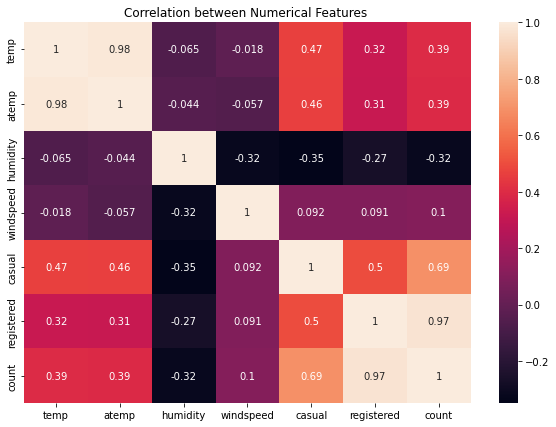

In [40]:
plt.figure(figsize=(10,7))
sns.heatmap(copy_data[['temp',
       'atemp', 'humidity', 'windspeed', 'casual', 'registered', 'count']].corr(),annot=True)
plt.title("Correlation between Numerical Features ")
plt.show()

- Correlation between temperature and number of cycles rented for all customers: 0.39
- Correlation between Temperature and Number of Cycles Rented for casual subscribers: 0.46
- Correlation between Temperature and Number of Cycles Rented for registered subscribers: 0.31
- Humidity has a negative correlation with the number of cycles rented which is: 0.32


###### season:

- 1: spring, 2: summer, 3: fall, 4: winter

###### holiday:

- whether day is a holiday or not

###### workingday:

- if day is neither weekend nor holiday is 1, otherwise is 0.

###### weather:

- 1: Clear, Few clouds, partly cloudy, partly cloudy

- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist

- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds

- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog

##### season:
- 1: spring, 2: summer, 3: fall, 4: winter

<AxesSubplot:xlabel='season', ylabel='count'>

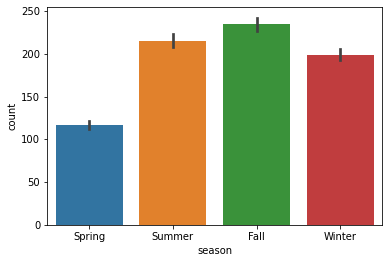

In [41]:
sns.barplot(x='season', y='count', data=copy_data)

In [42]:
copy_data.groupby('season')['count'].mean()

season
Fall      234.417124
Spring    116.343261
Summer    215.251372
Winter    198.988296
Name: count, dtype: float64

Less Number of people took vehicle in spring season and more number of bookings happen in Fall season

##### holiday:
- whether day is a holiday or not

<AxesSubplot:xlabel='holiday', ylabel='count'>

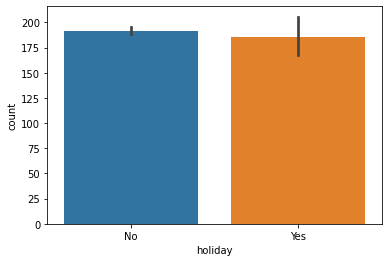

In [43]:
sns.barplot(x='holiday', y='count', data=copy_data)

In [44]:
copy_data.groupby('holiday')['count'].mean()

holiday
No     191.741655
Yes    185.877814
Name: count, dtype: float64

###### workingday:
- if day is neither weekend nor holiday is 1, otherwise is 0.

<AxesSubplot:xlabel='workingday', ylabel='count'>

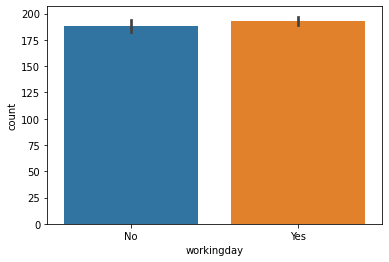

In [45]:
sns.barplot(x='workingday', y='count', data=copy_data)

In [46]:
copy_data.groupby('workingday')['count'].mean()

workingday
No     188.506621
Yes    193.011873
Name: count, dtype: float64

###### weather:
- 1: Clear, Few clouds, partly cloudy, partly cloudy

- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist

- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds

- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog

<AxesSubplot:xlabel='weather', ylabel='count'>

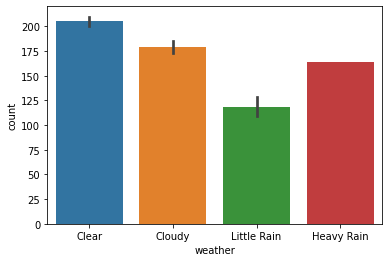

In [47]:
sns.barplot(x="weather", y="count", data=copy_data)

In [48]:
copy_data.groupby('weather')['count'].mean()

weather
Clear          205.236791
Cloudy         178.955540
Heavy Rain     164.000000
Little Rain    118.846333
Name: count, dtype: float64

- 1: Clear, Few clouds, partly cloudy, partly cloudy:  More number of people hire in this weather
- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds: Less number of people hire vehicle in this season

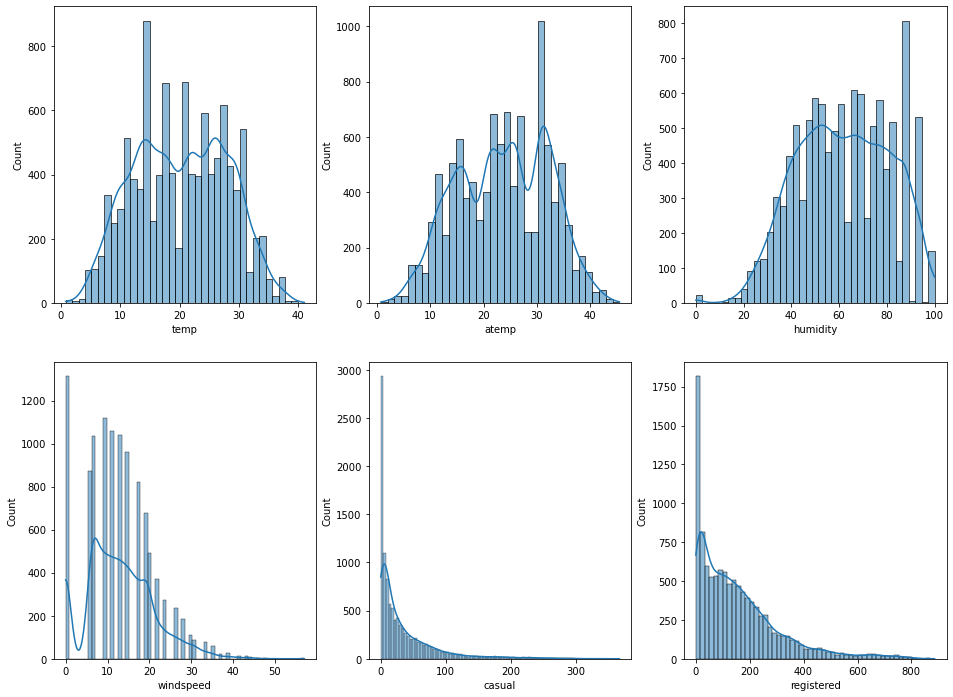

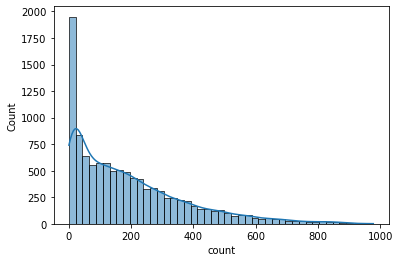

In [49]:
# understanding the distribution for numerical variables
num_cols = ['temp', 'atemp', 'humidity', 'windspeed', 'casual', 'registered','count']

fig, axis = plt.subplots(nrows=2, ncols=3, figsize=(16, 12))

index = 0
for row in range(2):
    for col in range(3):
        sns.histplot(copy_data[num_cols[index]], ax=axis[row, col], kde=True)
        index += 1
        
plt.show()
sns.histplot(copy_data[num_cols[-1]], kde=True) 
plt.show()

- casual, registered and count somewhat looks like Log Normal Distrinution
- temp, atemp and humidity looks like they follows the Normal Distribution
- windspeed follows the binomial distribution

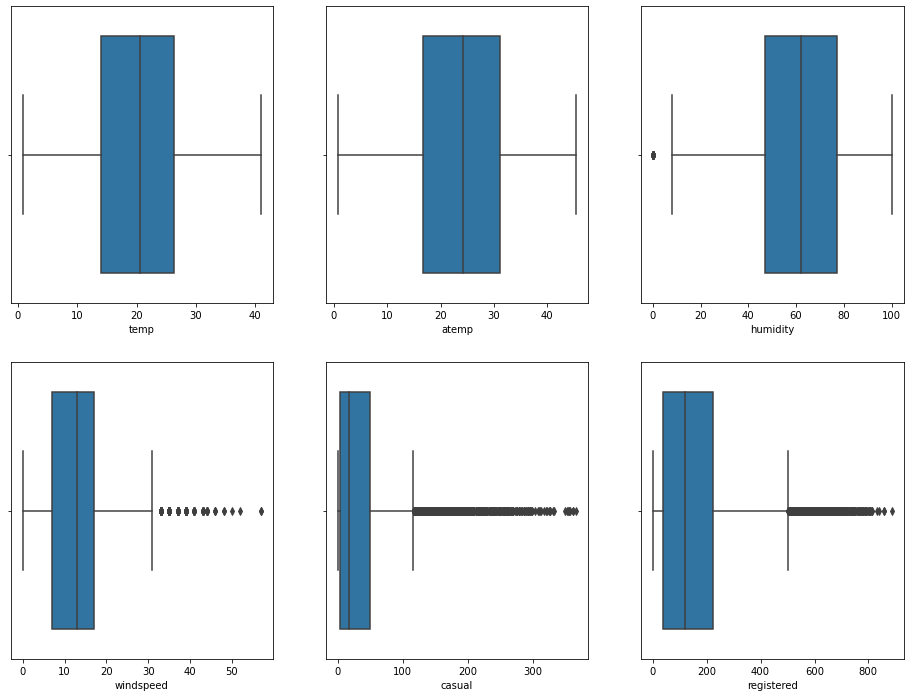

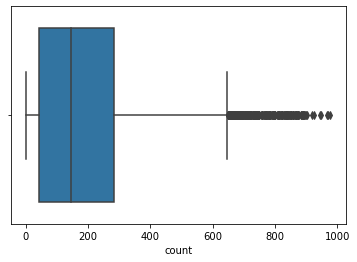

In [50]:
# plotting box plots to detect outliers in the data
fig, axis = plt.subplots(nrows=2, ncols=3, figsize=(16, 12))

index = 0
for row in range(2):
    for col in range(3):
        sns.boxplot(x=copy_data[num_cols[index]], ax=axis[row, col])
        index += 1
        
plt.show()
sns.boxplot(x=copy_data[num_cols[-1]]) 
plt.show()

- Looks like humidity, windspeed, casual, registered and count have outliers in the data.

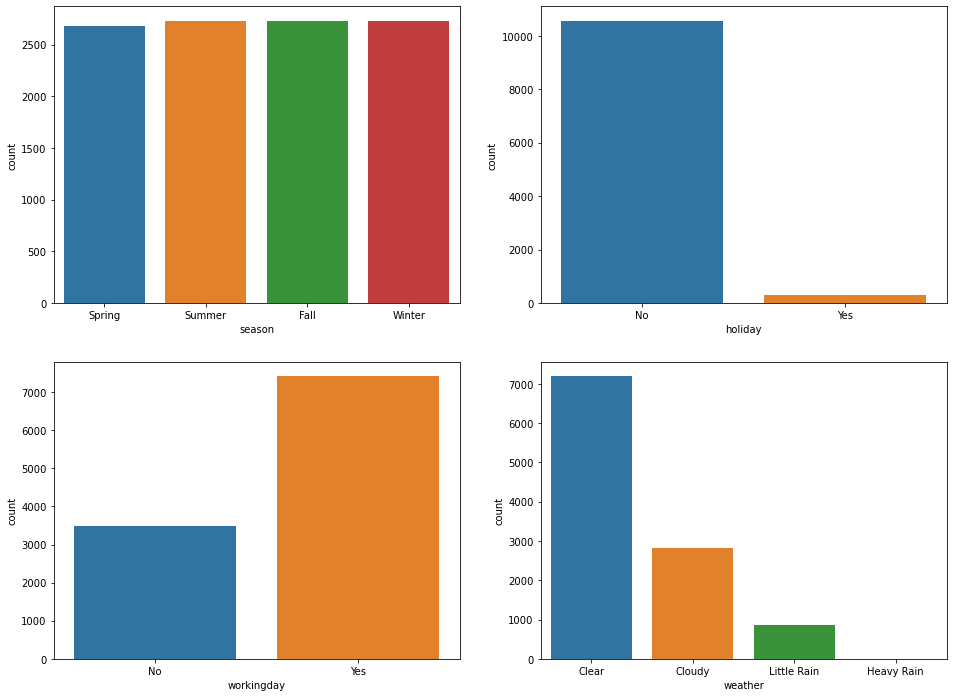

In [51]:
# countplot of each categorical column
fig, axis = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

index = 0
for row in range(2):
    for col in range(2):
        sns.countplot(data=copy_data, x=cat_cols[index], ax=axis[row, col])
        index += 1
        
plt.show()

- Data looks common as it should be like equal number of days in each season, more working days and weather is mostly Clear, Few clouds, partly cloudy, partly cloudy

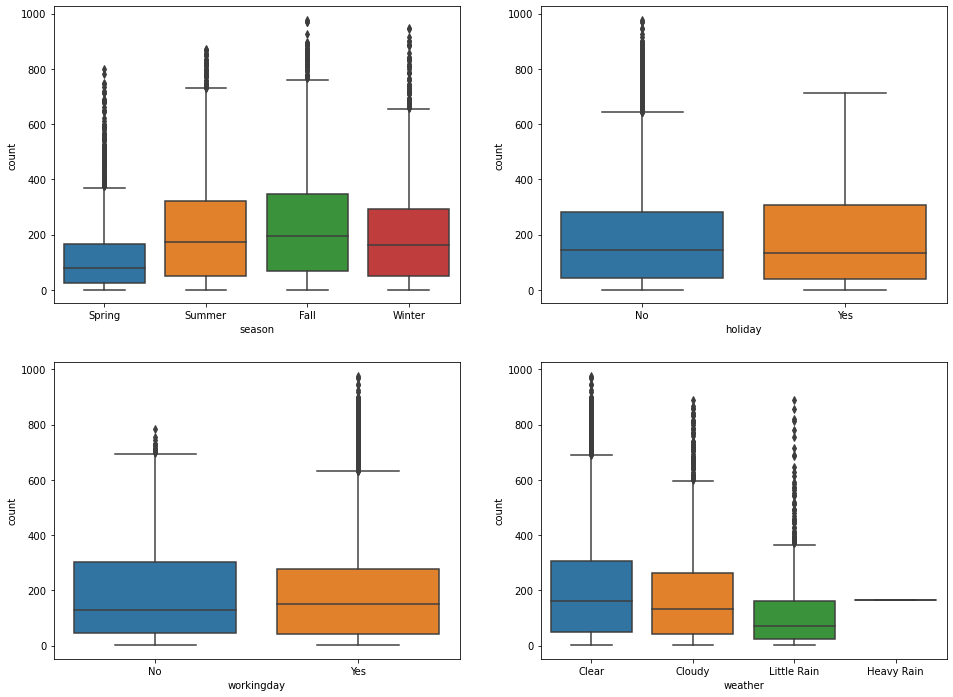

In [52]:
# plotting categorical variables againt count using boxplots
fig, axis = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

index = 0
for row in range(2):
    for col in range(2):
        sns.boxplot(data=copy_data, x=cat_cols[index], y='count', ax=axis[row, col])
        index += 1
        
plt.show()

- In summer and fall seasons more bikes are rented as compared to other seasons.
- Whenever its a holiday more bikes are rented.
- It is also clear from the workingday also that whenever day is holiday or weekend, slightly more bikes were rented.
- Whenever there is rain, thunderstorm, snow or fog, there were less bikes were rented.

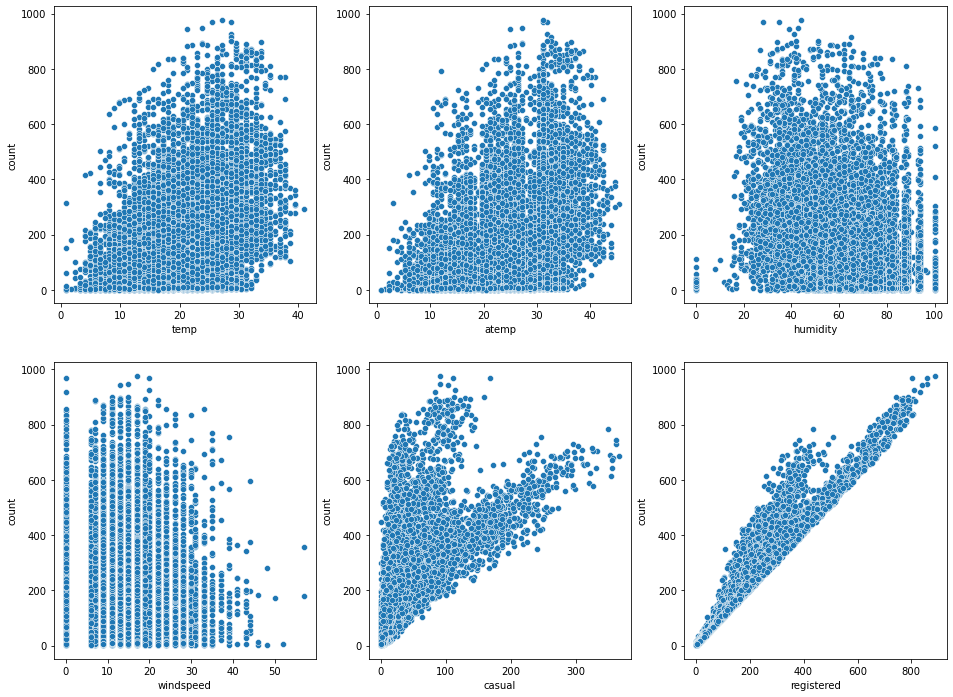

In [53]:
# plotting numerical variables against count using scatterplot
fig, axis=plt.subplots(nrows=2,ncols=3,figsize=(16,12))
index=0
for row in range(2):
    for col in range(3):
        sns.scatterplot(data=copy_data, x=num_cols[index], y='count', ax=axis[row,col])
        index+=1
plt.show()

- Whenever the humidity is less than 20, number of bikes rented is very very low.
- Whenever the temperature is less than 10, number of bikes rented is less.
- Whenever the windspeed is greater than 35, number of bikes rented is less.

## Pre-processed DataSet

In [54]:
copy_data.sample(10)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,...,count,day,date,hour,Month,Month_name,year,temperature,gethumidity,windspeed_category
9514,2012-09-19 19:00:00,Fall,No,Yes,Clear,22.96,26.515,43,15.0013,72,...,611,Wednesday,2012-09-19,19,9,September,2012,moderate,50%,"(12.998, 15.001]"
8607,2012-08-01 00:00:00,Fall,No,Yes,Clear,27.88,31.820,79,11.0014,3,...,47,Wednesday,2012-08-01,0,8,August,2012,moderate,80%,"(8.998, 12.998]"
617,2011-02-08 21:00:00,Spring,No,Yes,Clear,5.74,5.305,33,31.0009,8,...,54,Tuesday,2011-02-08,21,2,February,2011,very low,40%,"(22.003, 56.997]"
2118,2011-05-15 04:00:00,Summer,No,No,Cloudy,21.32,25.000,100,0.0000,5,...,13,Sunday,2011-05-15,4,5,May,2011,moderate,100%,"(-0.001, 6.003]"
6919,2012-04-06 15:00:00,Summer,No,Yes,Clear,20.50,24.240,27,19.0012,218,...,537,Friday,2012-04-06,15,4,April,2012,moderate,30%,"(16.998, 22.003]"
2093,2011-05-14 03:00:00,Summer,No,No,Cloudy,20.50,24.240,88,8.9981,5,...,35,Saturday,2011-05-14,3,5,May,2011,moderate,90%,"(7.002, 8.998]"
6780,2012-03-19 19:00:00,Spring,No,Yes,Clear,25.42,30.305,61,15.0013,86,...,549,Monday,2012-03-19,19,3,March,2012,moderate,70%,"(12.998, 15.001]"
7392,2012-05-07 09:00:00,Summer,No,Yes,Cloudy,20.50,24.240,82,15.0013,61,...,350,Monday,2012-05-07,9,5,May,2012,moderate,90%,"(12.998, 15.001]"
4548,2011-11-02 14:00:00,Winter,No,Yes,Clear,20.50,24.240,45,11.0014,40,...,172,Wednesday,2011-11-02,14,11,November,2011,moderate,50%,"(8.998, 12.998]"
10276,2012-11-13 14:00:00,Winter,No,Yes,Clear,15.58,19.695,46,26.0027,34,...,203,Tuesday,2012-11-13,14,11,November,2012,low,50%,"(22.003, 56.997]"


### Features:
- Dependent variables: count, registerd, casual
- Independent variables: workingday, holiday, weather, seasons, temperature, humidity, windspeed

## Outliers detection in Dataset

In [55]:
def detect_outliers(data):
    length_before=len(data)
    Q1=np.percentile(data,25)
    Q3=np.percentile(data,75)
    IQR=Q3-Q1
    upperbound=Q3+1.5*IQR
    lowerbound=Q1-1.5*IQR
    if lowerbound<0:
        lowerbound=0
        
    length_after=len(data[(data>lowerbound)&(data<upperbound)])
    return f"{np.round((length_before-length_after)/length_before,4)}% Outliers data from input data found"

In [56]:
rentedCyclesPerHour=data["count"]

In [57]:
detect_outliers(rentedCyclesPerHour)

'0.0278% Outliers data from input data found'

## Number of cycles rented by: Casual Users and Registerd Users

###### Average Number of Cycles rented by Casual vs Registered Subscribes :

In [58]:
registered_per_hour_median = copy_data.groupby("hour")["registered"].median()
casual_per_hour_median = copy_data.groupby("hour")["casual"].median()

In [59]:
registered_per_hour_median=registered_per_hour_median.reset_index()

In [60]:
casual_per_hour_median=casual_per_hour_median.reset_index()

In [61]:
casual_per_hour_median["hour"]+=1

In [62]:
registered_per_hour_median["hour"]+=1

In [63]:
median_count_per_hour=registered_per_hour_median.merge(casual_per_hour_median,on="hour")

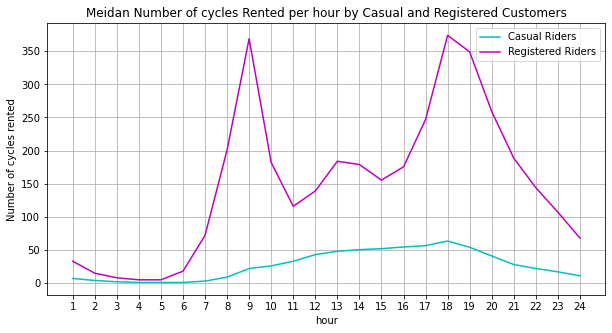

In [64]:
plt.figure(figsize=(10,5))
sns.lineplot(x=median_count_per_hour["hour"],
            y=median_count_per_hour["casual"], color="c", legend='auto')
sns.lineplot(x=median_count_per_hour["hour"],
        y=median_count_per_hour["registered"], color="m", legend='auto')
plt.legend(["Casual Riders", "Registered Riders"])
plt.title("Meidan Number of cycles Rented per hour by Casual and Registered Customers")
plt.grid()
plt.xticks(np.arange(1,25,1))
plt.ylabel("Number of cycles rented")
plt.show()

- Registered customers seems to be using rental cycles mostly for work-commute purpose
- Registered cycle counts seems to be much higher thaan casual customers

In [65]:
print("Casual Users (in%):")
(data["casual"].sum()/data["count"].sum())*100

Casual Users (in%):


18.8031413451893

In [66]:
print("Registerd Users (in%):")
(data["registered"].sum()/data["count"].sum())*100

Registerd Users (in%):


81.1968586548107

- 81% cycles has been rented by registered Customers
- 19% cycles has been rented by casual Customers

## Confidence Interval of Mean Number of cycles rented by casual and registered customers

In [67]:
def Confidence_Interval_Bootstrapping(data,confidence=95, sample_size=30000,trials=200):
    '''
    data: array
    confidence level: Required Confidence level
    sample size: length of sample size
    Trails: How many times we take sample from data.
    '''
    print("Data Distribution before Sampling/Bootstrap:  Data Distribution After Sampling/Bootstraping")
    
   
    bootstrapped_mean= np.empty(trials)

    for i in range(trials):
        btssample = data.sample(n=sample_size,replace=True)
        bootstrapped_mean[i] = np.mean(btssample)
   
    print()
    sample_mean = np.mean(bootstrapped_mean)
    sample_std = np.std(data)
    standard_error = sample_std/np.sqrt(sample_size)
    talfa_by2 = t.ppf((1-((1-(confidence)/100)/2)),df = sample_size-1)
    margin_of_error = talfa_by2*standard_error
    print("sample mean :",sample_mean)
    print("sample standard deviation :",sample_std)
    print("sample size: ",sample_size)
    plt.figure(figsize=(16,5))
    plt.subplot(121)
    sns.distplot(data,bins = 15)
    
    plt.subplot(122)
    
    sns.distplot(bootstrapped_mean,bins = 15)

    lower_ = sample_mean - margin_of_error
    upper_ = sample_mean + margin_of_error
    CI = (lower_,upper_)

    plt.axvline(x = lower_,c = "g")
    plt.axvline(x = upper_,c = "g")
    plt.show()



    print("Confidence Interval:", CI)
    

## Confidence Interval of Average Number of Cycles Rented by Registered Customers

Data Distribution before Sampling/Bootstrap:  Data Distribution After Sampling/Bootstraping

sample mean : 155.604009
sample standard deviation : 151.03209561628552
sample size:  30000


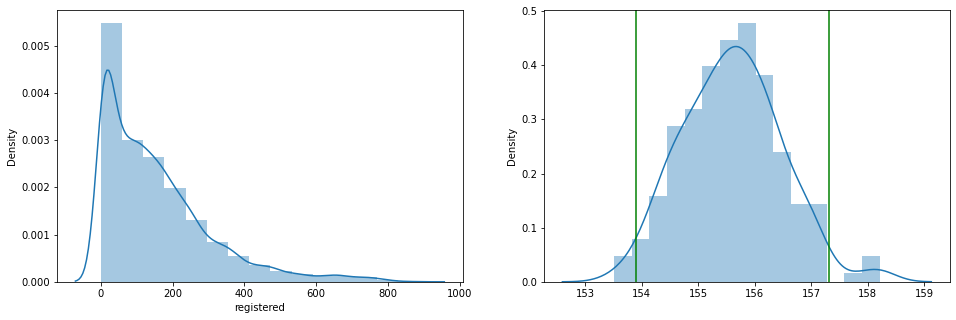

Confidence Interval: (153.89488239432788, 157.3131356056721)


In [68]:
Confidence_Interval_Bootstrapping(data["registered"])

## Confidence Interval of Average Number of Cycles Rented by Casual Customers

Data Distribution before Sampling/Bootstrap:  Data Distribution After Sampling/Bootstraping

sample mean : 35.998522666666666
sample standard deviation : 49.95818180763136
sample size:  30000


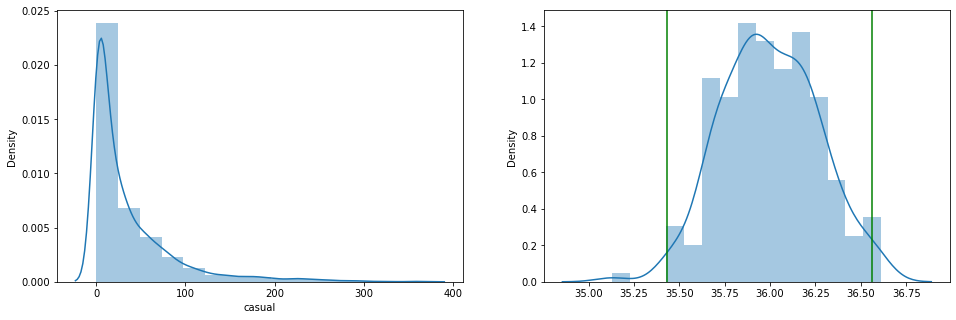

Confidence Interval: (35.43318019856401, 36.56386513476932)


In [69]:
Confidence_Interval_Bootstrapping(data["casual"])

## Hourly Median Number of Cycles rented during the day 

In [70]:
fig=px.bar(y=copy_data.groupby("hour")["count"].median(),
          x=copy_data.groupby("hour")["count"].median().index, text_auto='.2s',
          labels={
              "x":"Hours",
              "y":"Median value of Number of cycles rented",
          },
          title="Median Number of Cycles Rented per hour during a day"
          )
fig.update_layout(
    xaxis=dict(
    tickmode='linear',
    tick0=0,
    dtick=1)
)
fig.show()

- shows the median value of number of cycles were rented during perticular hour of the day.

- Median of number of cycles rented are higher during morning 7 to 9 am to evening 4 to 8pm .

## Effect of seasons on number of cycles rented during hours

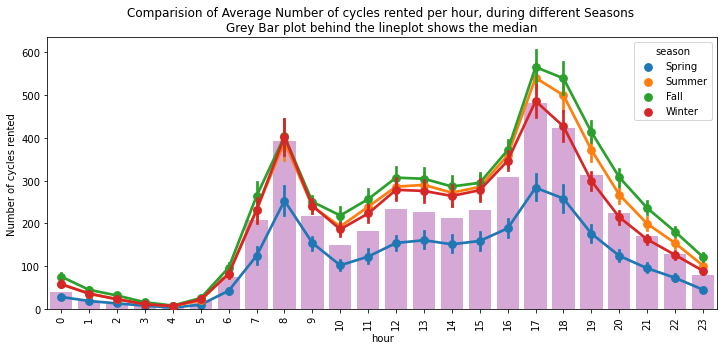

In [71]:
plt.figure(figsize=(12,5))
sns.barplot(y = copy_data.groupby("hour")["count"].median(),
           x = copy_data.groupby("hour")["count"].median().index,
            color="plum")
sns.pointplot(x = copy_data["hour"],
              y= copy_data["count"],
              hue=copy_data["season"],
              ci=95)
plt.title("Comparision of Average Number of cycles rented per hour, during different Seasons \nGrey Bar plot behind the lineplot shows the median")
plt.xticks(rotation = 90)
plt.ylabel("Number of cycles rented")
plt.show()

- Morning 7am-9am cycle rent counts is increasing
- Evening 4pm-7pm cycle rent counts is increasing
- In spring season, people prefer less likely to rent the cycle

## Number of cycles rented during differnet seasons (in %)

In [72]:
season_wise_rent_percentage = copy_data.groupby("season")["count"].sum()/np.sum(copy_data["count"])*100
season_wise_rent_percentage

season
Fall      30.720181
Spring    14.984493
Summer    28.208524
Winter    26.086802
Name: count, dtype: float64

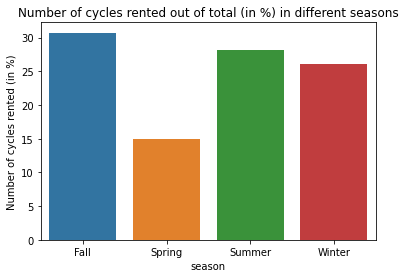

In [73]:
sns.barplot(x= season_wise_rent_percentage.index,
           y = season_wise_rent_percentage)
plt.ylabel("Number of cycles rented (in %)")
plt.title("Number of cycles rented out of total (in %) in different seasons")
plt.show()

## weather effect on cycle rental median counts hourly

In [74]:
weather_wise_rent_percentage = copy_data.groupby("weather")["count"].sum()/np.sum(data["count"])*100
weather_wise_rent_percentage

weather
Clear          70.778230
Cloudy         24.318669
Heavy Rain      0.007864
Little Rain     4.895237
Name: count, dtype: float64

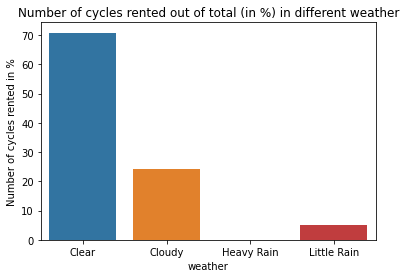

In [75]:
sns.barplot(x= weather_wise_rent_percentage.index,
           y = weather_wise_rent_percentage)
plt.title("Number of cycles rented out of total (in %) in different weather")

plt.ylabel("Number of cycles rented in %")
plt.show()

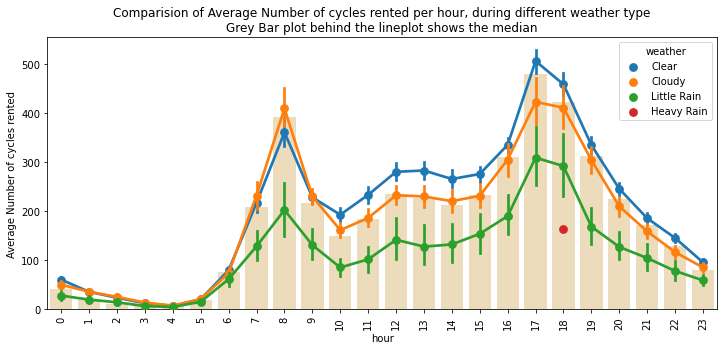

In [76]:

plt.figure(figsize=(12,5))
sns.barplot(y = copy_data.groupby("hour")["count"].median(),
           x = copy_data.groupby("hour")["count"].median().index,
            color="wheat")
sns.pointplot(x = copy_data["hour"],
              y= copy_data["count"],
              hue=copy_data["weather"],
              ci=95)
plt.title("Comparision of Average Number of cycles rented per hour, during different weather type\nGrey Bar plot behind the lineplot shows the median")

plt.xticks(rotation = 90)
plt.ylabel("Average Number of cycles rented")
plt.show()

- 70% of the cycles were rented when it was clear weather.

- 24% of the cycles were rented when it was cloudy weather .

- During rainy weather , only around 5% of the cycles were rented.

# Distributions and Comparision of number of number of cycles rented during working days and off days, across diffrent seasons

- Boxplot - distributoin of number of bike rented, durig different weaher as per workingday or not!

In [77]:
fig = px.box(copy_data, x="weather", y="count", color="workingday",
            title="Number of cycles rented Boxplot during Workday and Offday as per different weather conditions")

fig.show()

- during spring season , number of bike rented were lower than summer and fall.

# Overview on distribution of Numerical Features

array([[<AxesSubplot:title={'center':'datetime'}>,
        <AxesSubplot:title={'center':'temp'}>,
        <AxesSubplot:title={'center':'atemp'}>],
       [<AxesSubplot:title={'center':'humidity'}>,
        <AxesSubplot:title={'center':'windspeed'}>,
        <AxesSubplot:title={'center':'casual'}>],
       [<AxesSubplot:title={'center':'registered'}>,
        <AxesSubplot:title={'center':'count'}>,
        <AxesSubplot:title={'center':'hour'}>],
       [<AxesSubplot:title={'center':'Month'}>,
        <AxesSubplot:title={'center':'year'}>, <AxesSubplot:>]],
      dtype=object)

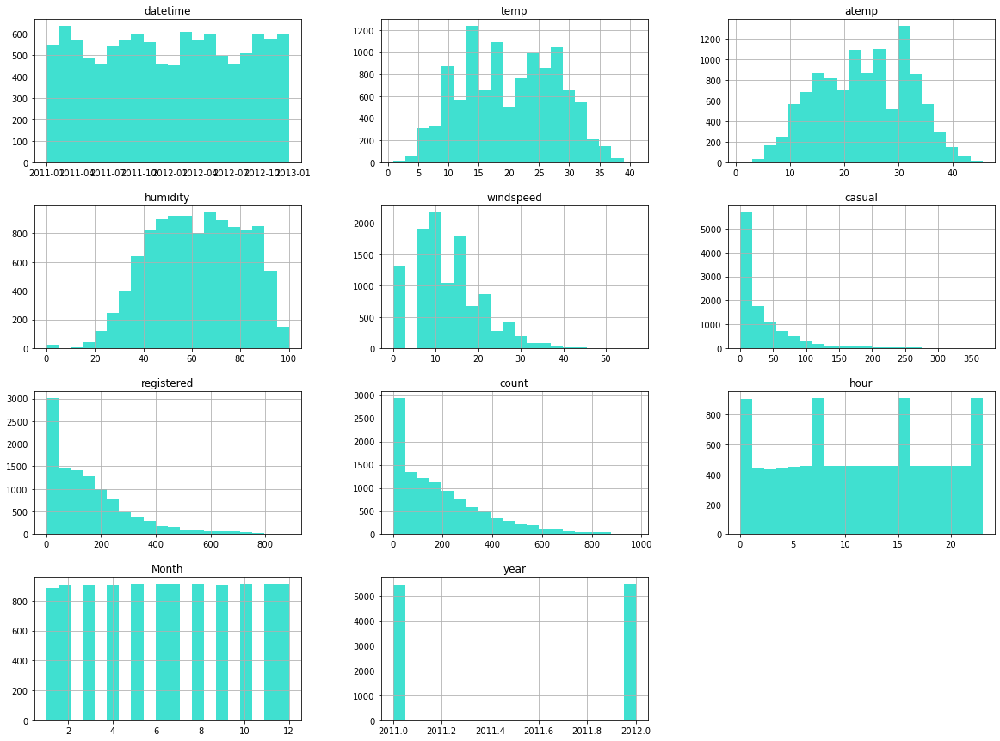

In [78]:
copy_data.hist(bins=20, figsize=(20,15), color='turquoise')

- From above distribution plots of number of bikes rented , are not normally distributed.
- There are outliers in the data and overall distributions are heavily right skewed .
- Data need to be tranformed for hypothesis test calculations further.

# Yearly differencce in number of bike rental

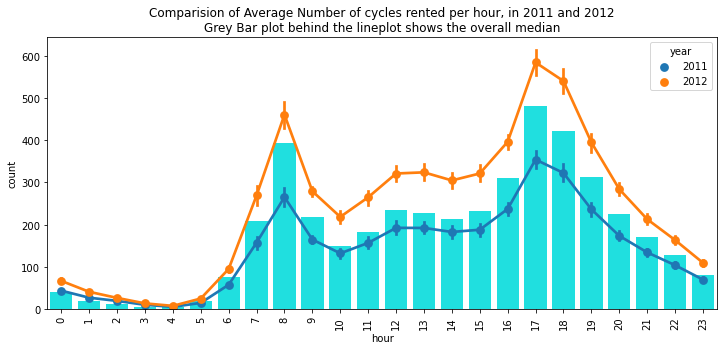

In [79]:
plt.figure(figsize=(12,5))
sns.barplot(y = copy_data.groupby("hour")["count"].median(),
           x = copy_data.groupby("hour")["count"].median().index,
            color="cyan")
sns.pointplot(x = copy_data["hour"],
              y= copy_data["count"],
              hue=copy_data["year"],
              ci=95)
plt.title("Comparision of Average Number of cycles rented per hour, in 2011 and 2012\nGrey Bar plot behind the lineplot shows the overall median")
plt.xticks(rotation = 90)
plt.show()

In [80]:
copy_data.groupby("year")["count"].median()

year
2011    111.0
2012    199.0
Name: count, dtype: float64

In [81]:
(((199-111)/111))*100

79.27927927927928

- In 2011 there's 79.27% hike in hourly median number of bike rental.

In [82]:
copy_data.groupby("year")["registered"].median()

year
2011     91.0
2012    161.0
Name: registered, dtype: float64

In [83]:
(((161-91)/91))*100

76.92307692307693

- Registered Customers, 76% hike in hourly median cycle rental from 2011 to 2012.
- In 2011, median number of hourly rental were 13 and in 2012 it's 20.

## Number and cycles rented and temperature correlation

In [84]:
fig = px.scatter(copy_data, x="count", y="atemp",  color="count", trendline="ols",
                title="temperature correlation with Number of bikes rented")
fig.show()

- Positive correlation across temperature and number of bikes rented.

## Categorising the temperature as low, verylow, moderate, high

In [85]:
copy_data["temperature"].value_counts()

moderate    4767
low         4318
very low    1014
high         787
Name: temperature, dtype: int64

In [86]:
fig = px.box(copy_data, x="temperature", y="count", color="workingday",
            title= "Boxplots of Number of cycles rented distribution as per working day or offday in different temperatures")
fig.show()

- Number of bike rented during moderate to high temerature is significantly higher than lower temperature.

## Offday vs working day number of cycles rented trend during a day

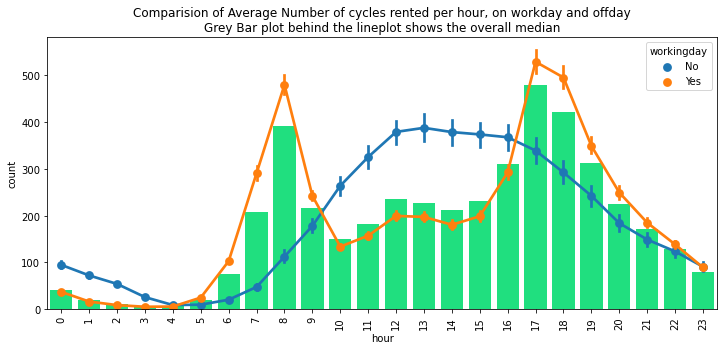

In [87]:
plt.figure(figsize=(12,5))
sns.barplot(y = copy_data.groupby("hour")["count"].median(),
           x = copy_data.groupby("hour")["count"].median().index,
            color="springgreen")
sns.pointplot(x = copy_data["hour"],
              y= copy_data["count"],
              hue=copy_data["workingday"],
              ci=95)
plt.title("Comparision of Average Number of cycles rented per hour, on workday and offday\nGrey Bar plot behind the lineplot shows the overall median")

plt.xticks(rotation = 90)
plt.show()

- Number of cycles rented changed as per working day and off-day, trend is opposit.

- On off days , number of cycles rented increases during the day time, which is opposite of during working days.

- From above plot it looks like, working day count of cycle rented seems to be higher than offday. lets do a AB test : weather mean of rented cycled on working day and offdays are same or not 

##### Hourly median number of cycles rented during Workingday

In [88]:
copy_data.groupby("workingday")["count"].median()

workingday
No     128.0
Yes    151.0
Name: count, dtype: float64

##### Hourly average number of cycles rented during Workingday

In [89]:
copy_data.groupby("workingday")["count"].mean()

workingday
No     188.506621
Yes    193.011873
Name: count, dtype: float64

#### Number of bikes rented during working day and off-day

In [90]:
fig = px.box(copy_data, x="workingday", y="count",
            title="Boxplot shows the distribution of number of bikes rented on offdays and workingdays")
fig.show()

- Distribution of hourly number of bikes rented during working day and off day seems similar.
- Stills there are more outliers in Workingday Category.

### Distribution Plot of Number of Cycles Rented by Registered and Casual Customers

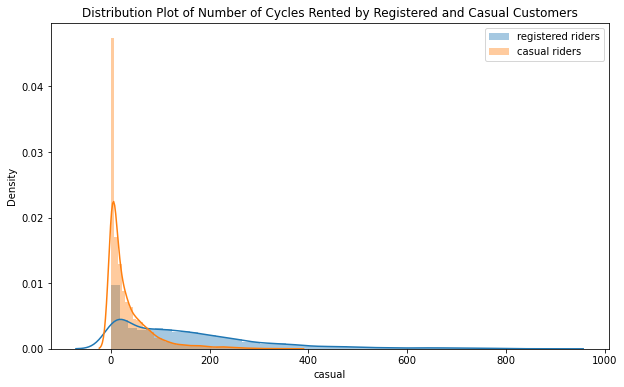

In [91]:
plt.figure(figsize=(10,6))

sns.distplot(copy_data["registered"], label = "registered riders")
sns.distplot(copy_data["casual"], label = "casual riders")
plt.title("Distribution Plot of Number of Cycles Rented by Registered and Casual Customers")
plt.legend()
plt.show()

# Hypothsis Testing 

### T-Test

###### Null Hypothesis: Working day has no effect on the number of cycles being rented.

###### Alternate Hypothesis: Working day has effect on the number of cycles being rented.

###### Significance level (alpha): 0.05

##### We will use the 2-Sample T-Test to test the hypothess defined above

#### If working day and offdays have any effect on the nunmber of electric cycles rented

- Distribution of number of bikes rented as per working day or offday (in percentages )

In [92]:
copy_data.groupby("workingday")["count"].sum()/np.sum(data["count"])*100

workingday
No     31.40156
Yes    68.59844
Name: count, dtype: float64

In [93]:
workingday=copy_data.loc[copy_data["workingday"]=="Yes"]["count"]
offday=copy_data.loc[copy_data["workingday"]=="No"]["count"]

- Establishing Hypothesis :

  - 1.H0: average number of cycles rented on workingdays   =   average number of cycles rented on offday 
  - 2.Ha: average number of cycles rented on workingdays  !=   average number of cycles rented on offday

In [94]:
m1 = np.mean(workingday)
n1 = len(workingday)
s1 = np.std(workingday,ddof = 1)

m2 = np.mean(offday)
n2 = len(offday)
s2 = np.std(offday,ddof = 1)


In [95]:
m1,m2,m1-m2

(193.01187263896384, 188.50662061024755, 4.505252028716285)

In [96]:
# Calculating T-Statistic
T_observed =(m1-m2)/(np.sqrt(((s1**2)/n1)+((s2**2)/n2)))
T_observed

1.236258041822322

In [97]:
# P-Value
p_value = 2*(1-stats.t.cdf(T_observed,n1+n2-2))
p_value

0.2163893399034813

In [98]:
# Extream Critical Value
T_critical=stats.t.ppf(0.975,n1+n2-2)
T_critical

1.9601819678713073

In [99]:
p_value>0.05

True

In [100]:
-T_critical <  T_observed < T_critical 

True

- Failed to reject null Hypothesis

- Mean of number of cycles rented on working days are equal as the cycles rented on offdays.

### Month and Season Wise, effect on median and average number of rented cycle

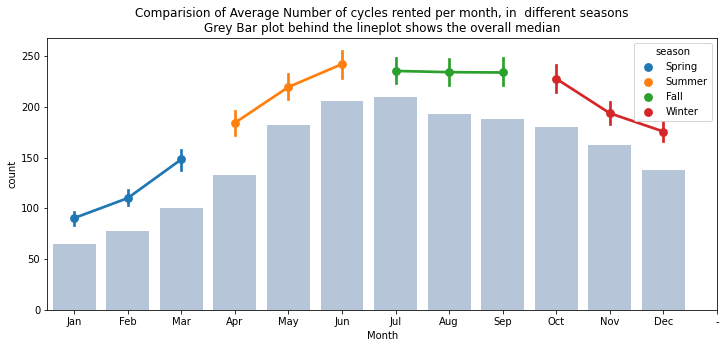

In [101]:
plt.figure(figsize=(12,5))
sns.barplot(y = copy_data.groupby("Month")["count"].median(),
           x = copy_data.groupby("Month")["count"].median().index,
           color="lightsteelblue")
sns.pointplot(x = copy_data["Month"],
              y= copy_data["count"],
              hue=copy_data["season"],
              ci=95)
plt.title("Comparision of Average Number of cycles rented per month, in  different seasons\nGrey Bar plot behind the lineplot shows the overall median")

plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11,12],["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec","-"])

plt.show()

- Decrease in count of rental cycle during winter season and opening spring season
- Increase in count during summer season and stay constant till pre- winter season
- Increase in count from May to November

## Temperature effect on cycle rental

In [102]:
temperature_wise_rent_percentage = copy_data.groupby("temperature")["count"].sum()/np.sum(copy_data["count"])*100
temperature_wise_rent_percentage

temperature
high        12.487269
low         30.172248
moderate    53.538617
very low     3.801866
Name: count, dtype: float64

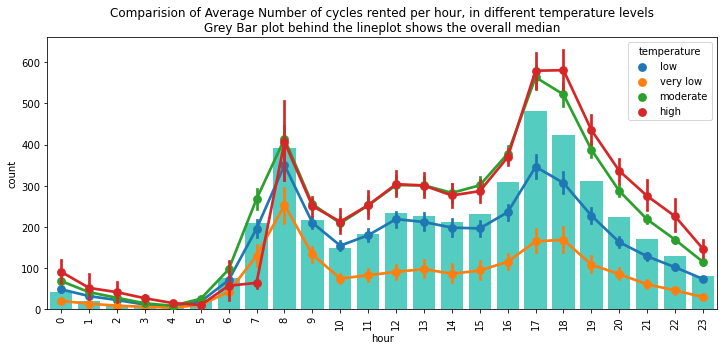

In [103]:
plt.figure(figsize=(12,5))
sns.barplot(y = copy_data.groupby("hour")["count"].median(),
           x = copy_data.groupby("hour")["count"].median().index,
            color="turquoise")
sns.pointplot(x = copy_data["hour"],
              y= copy_data["count"],
              hue=copy_data["temperature"],
              ci=95)
plt.title("Comparision of Average Number of cycles rented per hour, in different temperature levels\nGrey Bar plot behind the lineplot shows the overall median")

plt.xticks(rotation = 90)
plt.show()

- Average Number of bikes are higher in moderate to high temperature.
- Average Number of bikes are low when temperature is low to very low.

## Humidity V/S Count

In [104]:
fig = px.scatter(copy_data, y="count", x="humidity",  color="weather", trendline="ols",
                title=" correlation between humidity and number of bikes rented during different weather")
fig.show()

- Scatter plot above , shows kind of a negative correlation , between humidity and number of bikes rented.

In [105]:
humidity_wise_rent_percentage = copy_data.groupby("gethumidity")["count"].sum()/np.sum(copy_data["count"])*100
humidity_wise_rent_percentage

gethumidity
10%      0.038696
100%     2.565314
20%      0.635970
30%      5.942528
40%     15.798887
50%     19.659541
60%     18.030512
70%     16.507215
80%     11.268459
90%      9.552879
Name: count, dtype: float64

- After Categorising Humidity level, we can see that counts are increasing from humidity level of 40% to 70%.
- 40% to 70% humidity level seems to be most comfortable for cycling.

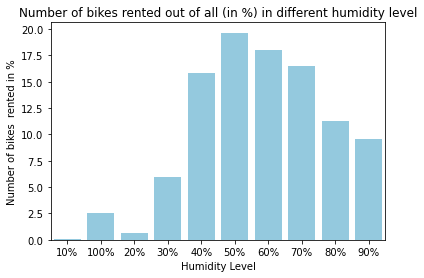

In [106]:
sns.barplot(x= humidity_wise_rent_percentage.index,
           y = humidity_wise_rent_percentage,color="skyblue")
plt.title("Number of bikes rented out of all (in %) in different humidity level")
plt.ylabel("Number of bikes  rented in %")
plt.xlabel("Humidity Level")
plt.show()

## Windspeed v/s Count

In [107]:
fig = px.scatter(copy_data, y="count", x="windspeed",  color="weather", trendline="ols",
                title= "Correlation of Windspeed with Count of bikes rented during different weather")
fig.show()

In [108]:
windspeed_wise_rent_percentage = copy_data.groupby("windspeed_category")["count"].sum()/np.sum(copy_data["count"])*100
windspeed_wise_rent_percentage

windspeed_category
(-0.001, 6.003]     16.325482
(6.003, 7.002]       8.421435
(7.002, 8.998]       9.433002
(8.998, 12.998]     20.356743
(12.998, 15.001]     9.715336
(15.001, 16.998]     8.488901
(16.998, 22.003]    15.682703
(22.003, 56.997]    11.576398
Name: count, dtype: float64

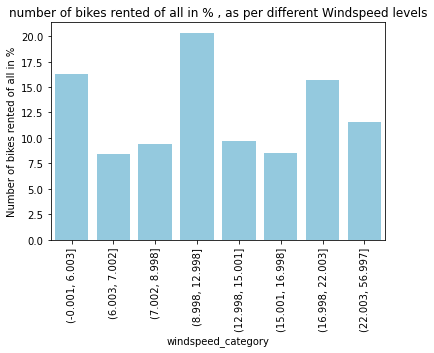

In [109]:
sns.barplot(x= windspeed_wise_rent_percentage.index,
           y = windspeed_wise_rent_percentage,color="skyblue")
plt.title("number of bikes rented of all in % , as per different Windspeed levels")
plt.ylabel("Number of bikes rented of all in %")
plt.xticks(rotation =90)
plt.show()

- Windspeed and Number of bike rented are inversely proportional to eachother

### We are checking if weather and season has a relation
#### chi-square test : for independence :
###### weather and season are categorical variables so, for dependency : chi square test :
- H0: Weather proportion is same across all season
- Ha: Weather proportions is different across different seasons
###### Significance level (alpha): 0.05

In [110]:
temp_data = copy_data[copy_data["weather"].isin(["Little Rain","Clear","Cloudy"])]

In [111]:
observed = pd.crosstab(index = temp_data["season"],
           columns = temp_data["weather"],
            values= temp_data["count"],
           aggfunc=np.sum
           )

In [112]:
observed

weather,Clear,Cloudy,Little Rain
season,,,
Fall,470116,139386,31160
Spring,223009,76406,12919
Summer,426350,134177,27755
Winter,356588,157191,30255


In [113]:
row_sum = np.array(np.sum(observed,axis = 1))
col_sum = np.array(np.sum(observed,axis = 0))

In [114]:
pd.crosstab(index = temp_data["season"],
           columns = temp_data["weather"],
               values= temp_data["count"],
           aggfunc=np.sum,
            margins=True)

weather,Clear,Cloudy,Little Rain,All
season,,,,
Fall,470116,139386,31160,640662
Spring,223009,76406,12919,312334
Summer,426350,134177,27755,588282
Winter,356588,157191,30255,544034
All,1476063,507160,102089,2085312


In [115]:
expected = []
for i in row_sum:
    expected.append((i*col_sum)/np.sum(np.sum(observed,axis = 0)))
expected

[array([453484.88557396, 155812.72247031,  31364.39195574]),
 array([221081.86259035,  75961.44434981,  15290.69305984]),
 array([416408.3330293 , 143073.60199337,  28800.06497733]),
 array([385087.91880639, 132312.23118651,  26633.8500071 ])]

In [116]:
expected = pd.DataFrame(expected,columns=observed.columns)

In [117]:
expected.index=observed.index

In [118]:
expected

weather,Clear,Cloudy,Little Rain
season,,,
Fall,453484.885574,155812.722470,31364.391956
Spring,221081.862590,75961.444350,15290.693060
Summer,416408.333029,143073.601993,28800.064977
Winter,385087.918806,132312.231187,26633.850007


In [119]:
T_observed = np.sum(np.sum(((observed-expected)**2)/expected))

In [120]:
T_observed

10838.372332480216

In [121]:
df = (len(observed)-1)*(len(observed.columns)-1)

In [122]:
T_critical = stats.chi2.ppf(0.95,df)
T_critical

12.591587243743977

In [123]:
p_value = 1-stats.chi2.cdf(T_observed,df)
p_value

0.0

In [124]:
if T_observed > T_critical:
    print("Reject Null Hypothesis : \nWeather and Season are dependent variables")
else:
    print("Failed to Reject Null Hypothesis :\nWeather and Season are independent Variables")

Reject Null Hypothesis : 
Weather and Season are dependent variables


In [125]:
#using library
stats.chi2_contingency(observed)

(10838.372332480214,
 0.0,
 6,
 array([[453484.88557396, 155812.72247031,  31364.39195574],
        [221081.86259035,  75961.44434981,  15290.69305984],
        [416408.3330293 , 143073.60199337,  28800.06497733],
        [385087.91880639, 132312.23118651,  26633.8500071 ]]))

In [126]:
def chi2Test_of_independence(table):
    print(table)
    observed = table.fillna(0)
    row_sum = np.array(np.sum(observed,axis = 1))
    col_sum = np.array(np.sum(observed,axis = 0))
    expected = []
    for i in row_sum:
        expected.append((i*col_sum)/np.sum(np.sum(observed,axis = 0)))
    expected = pd.DataFrame(expected,columns=observed.columns)

    expected.index = observed.index
    print()
    print((expected))
    T_observed = np.sum(np.sum(((observed-expected)**2)/expected))
    df = (len(observed)-1)*(len(observed.columns)-1)
    T_critical = stats.chi2.ppf(0.95,df)
    p_value = 1-stats.chi2.cdf(T_observed,df)
    print("T_statistic : ",np.round(T_observed,3),"\np_value : ",p_value)
    if T_observed > T_critical:
        print("Reject Null Hypothesis")
    else:
        print("Failed to Reject Null Hypothesis")

### Weather and temperature are dependent :
###### for dependency : chi square test :
- H0: weather and temperature are independent
- Ha: weather and temperature are dependent

In [127]:
observed_temp_weather = pd.crosstab(index=temp_data["weather"],
           columns= temp_data["temperature"],
                                   values=temp_data["casual"],
                                   aggfunc=np.sum)

In [128]:
chi2Test_of_independence(observed_temp_weather)

temperature   high    low  moderate  very low
weather                                      
Clear        52538  56379    177592      3391
Cloudy       11496  23163     51780       807
Little Rain   1726   3249      9869       139

temperature          high           low       moderate     very low
weather                                                            
Clear        48616.205381  61207.181565  176870.279678  3206.333375
Cloudy       14631.146791  18420.426916   53229.473683   964.952610
Little Rain   2512.647828   3163.391519    9141.246638   165.714015
T_statistic :  2979.804 
p_value :  0.0
Reject Null Hypothesis


- we can conclude that weather and temperature are dependent features

In [129]:
stats.chi2_contingency(observed_temp_weather)

(2979.8035003021923,
 0.0,
 6,
 array([[4.86162054e+04, 6.12071816e+04, 1.76870280e+05, 3.20633337e+03],
        [1.46311468e+04, 1.84204269e+04, 5.32294737e+04, 9.64952610e+02],
        [2.51264783e+03, 3.16339152e+03, 9.14124664e+03, 1.65714015e+02]]))

### Weather and Humidity Level are dependent :
###### for dependency : chi square test :
- H0: weather and Humidity are independent
- Ha: weather and Humidity are dependent

In [130]:
chi2Test_of_independence(pd.crosstab(index=temp_data["weather"],
           columns= temp_data["gethumidity"],
                                     values=temp_data["casual"],
                                   aggfunc=np.sum
                                    ))

gethumidity   10%    100%     20%      30%      40%      50%      60%  \
weather                                                                 
Clear        35.0   635.0  4374.0  26879.0  68726.0  69117.0  53398.0   
Cloudy        6.0  2385.0    51.0   3236.0   7090.0  13370.0  15420.0   
Little Rain  40.0  1681.0     NaN      NaN    357.0    925.0   1099.0   

gethumidity      70%      80%      90%  
weather                                 
Clear        38241.0  19202.0   9293.0  
Cloudy       20060.0  13803.0  11825.0  
Little Rain   2499.0   4355.0   4027.0  

gethumidity        10%         100%          20%           30%           40%  \
weather                                                                        
Clear        59.883100  3475.437675  3271.391557  22263.945028  56314.510531   
Cloudy       18.021942  1045.940101   984.532003   6700.379951  16947.967526   
Little Rain   3.094959   179.622224   169.076439   1150.675020   2910.521943   

gethumidity           50%  

- we can conclude that weather and humidity are dependent features

### Checking Average No. of cycles rented is similar or different in different weather

In [133]:
copy_data["weather"].unique()

array(['Clear', 'Cloudy', 'Little Rain', 'Heavy Rain'], dtype=object)

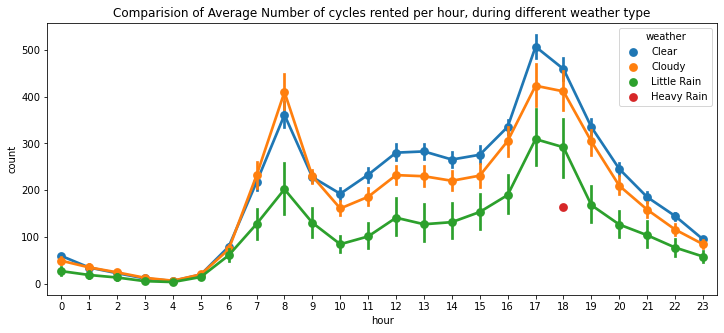

In [134]:
plt.figure(figsize=(12,5))
sns.pointplot(x = copy_data["hour"],
              y= copy_data["count"],
              hue=copy_data["weather"],
              ci=95)
plt.title("Comparision of Average Number of cycles rented per hour, during different weather type")
plt.show()

###### We have 4 different weather here, to check if there's significant differnece between 4 weathers
###### we can perform anova test 
#### Anova
###### Why are we Using Anova??
- because we have more than 2 groups
- 1.No. of cycles rented similar or different in different seasons

- NULL HYPOTHESIS: μ1 = μ2 = μ3 = μ3. The mean Count in every season is same.

- ALTERNATIVE HYPOTHESIS: Atleast one of mean of count is not same

###### Anova and all parametric tests assume-

- Normality:- Values in each sampled groups are assumed to be drawn from normally distributed populations. We can use normal probability plot or Q-Q plot to check normality.

- Homogeneity of variance:- All the c group variances are equal, that is σ₁² = σ₂² = σ₃² = … = σ𝒸².
##### Assumptions Test for Anova

- Anova assumes normality and also it assumes variances is same across all groups.

- H0: population mean of number of cycles rented in different seaons are same

- Ha: population mean of number of cycles rented in different seaons are different

In [135]:
Clear = copy_data.loc[copy_data["weather"]=="Clear"]["count"]
Cloudy = copy_data.loc[copy_data["weather"]=="Cloudy"]["count"]
Little_Rain = copy_data.loc[copy_data["weather"]=="Little Rain"]["count"]
Heavy_Rain = copy_data.loc[copy_data["weather"]=="Heavy Rain"]["count"]

In [136]:
len(Clear),len(Cloudy),len(Little_Rain),len(Heavy_Rain)

(7192, 2834, 859, 1)

- Heavy rain weather has only 1 record
- Exlcuding Heavy Rain weather from the test :
- checking the distribution before applying test :

<AxesSubplot:xlabel='count', ylabel='Density'>

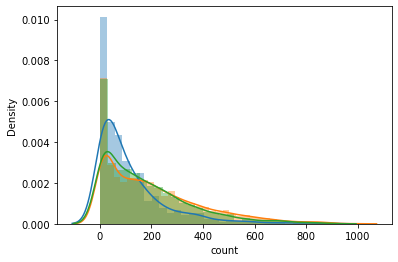

In [137]:
sns.distplot((Little_Rain))
sns.distplot((Clear))
sns.distplot((Cloudy))

- Data is nomally distributed , assumption for anova test breaks.

<AxesSubplot:ylabel='Density'>

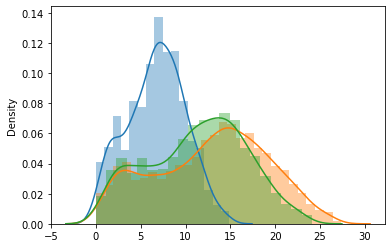

In [138]:
# Applying Boxcox transformation and checking the distribution
sns.distplot(stats.boxcox(Little_Rain)[0])
sns.distplot(stats.boxcox(Clear)[0])
sns.distplot(stats.boxcox(Cloudy)[0])

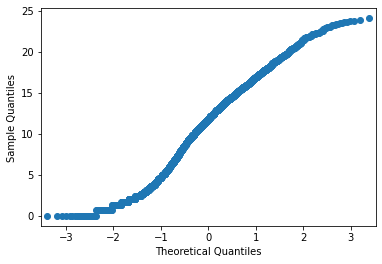

In [139]:
sm.qqplot((stats.boxcox(Cloudy)[0]))
plt.show()

In [140]:
# Testing if data is significantly normally distributed
stats.anderson(Clear,dist="norm"),stats.anderson(Cloudy,dist="norm"),stats.anderson(Little_Rain,dist="norm")

(AndersonResult(statistic=209.40911708071326, critical_values=array([0.576, 0.656, 0.787, 0.917, 1.091]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ])),
 AndersonResult(statistic=90.59885984506218, critical_values=array([0.575, 0.655, 0.786, 0.917, 1.09 ]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ])),
 AndersonResult(statistic=54.80752275061889, critical_values=array([0.573, 0.653, 0.783, 0.914, 1.087]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ])))

- Since the datasets for tests, are not normally distributed, and having significance varinace between weathers ,we cannot perform anova test.

## Non parametric test: Kruskal Wallies test

In [141]:
kwt  = copy_data[["weather","count"]]

In [144]:
kwt=kwt[kwt['weather'].isin(['Clear', 'Cloudy', 'Little Rain'])]

In [145]:
kwt["rank"] = kwt["count"].rank()

In [146]:
rank_sum = kwt.groupby("weather")["rank"].sum()
rank_sum = rank_sum.astype("int64")
rank_sum

weather
Clear          40752899
Cloudy         14990213
Little Rain     3503943
Name: rank, dtype: int64

In [148]:
N = len(kwt)
N

10885

In [149]:
dof = kwt["weather"].nunique()-1
dof

2

In [150]:
H = ((12/(N*(N+1)))*(np.sum(((rank_sum**2)/(kwt.groupby("weather")["rank"].count())))))-(3*(N+1))
H

204.95101790400076

In [151]:
p_value = 1-stats.chi2.cdf(205.073,dof)
p_value

0.0

In [152]:
H_critical = stats.chi2.ppf(0.95,2)
H_critical

5.991464547107979

- H statistic from Kruskal Wallis test , is higher than the Critical Value ,

- p_value is smaller than significant value 0.05 ,we reject Null Hypothesis.

- Hence we conclude that the Population mean number of cycles rented across different weather are not same.

In [154]:
Clear = copy_data.loc[copy_data["weather"]=="Clear"]["count"]
Cloudy = copy_data.loc[copy_data["weather"]=="Cloudy"]["count"]
Little_Rain = copy_data.loc[copy_data["weather"]=="Little Rain"]["count"]

In [155]:
stats.kruskal(Clear,Cloudy,Little_Rain)

KruskalResult(statistic=204.95566833068537, pvalue=3.122066178659941e-45)

###### No. of cycles rented is similar or different in different seasons¶

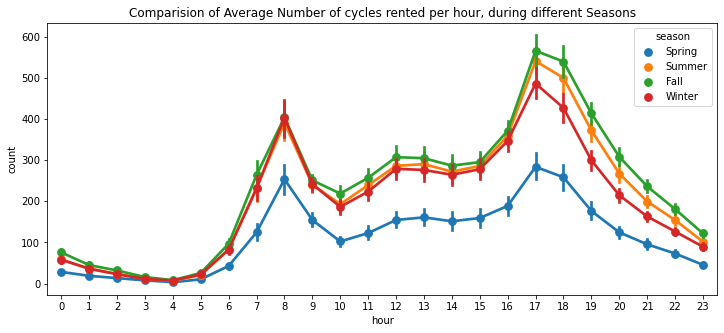

In [156]:
plt.figure(figsize=(12,5))
sns.pointplot(x = copy_data["hour"],
              y= copy_data["count"],
              hue=copy_data["season"],
              ci=95)
plt.title("Comparision of Average Number of cycles rented per hour, during different Seasons")
plt.show()

In [157]:
Spring = copy_data.loc[copy_data["season"]=="Spring"]["count"]
Summer = copy_data.loc[copy_data["season"]=="Summer"]["count"]
Fall = copy_data.loc[copy_data["season"]=="Fall"]["count"]
Winter = copy_data.loc[copy_data["season"]=="Winter"]["count"]

In [158]:
len(Spring),len(Summer),len(Fall),len(Winter)

(2686, 2733, 2733, 2734)

<AxesSubplot:ylabel='Density'>

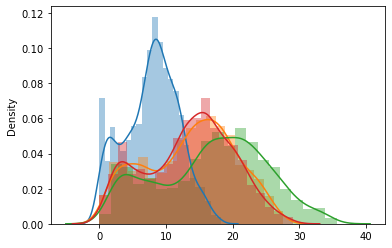

In [159]:
sns.distplot(stats.boxcox(Spring)[0])
sns.distplot(stats.boxcox(Summer)[0])
sns.distplot(stats.boxcox(Fall)[0])
sns.distplot(stats.boxcox(Winter)[0])

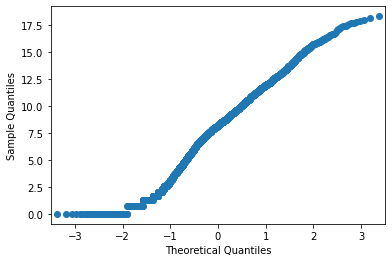

In [160]:
sm.qqplot((stats.boxcox(Spring)[0]))
plt.show()

In [161]:
# Testing if data is significantly normally distributed
stats.anderson(Spring,dist="norm"),stats.anderson(Summer,dist="norm"),stats.anderson(Fall,dist="norm"),stats.anderson(Winter,dist="norm")

(AndersonResult(statistic=134.99126589743582, critical_values=array([0.575, 0.655, 0.786, 0.917, 1.09 ]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ])),
 AndersonResult(statistic=73.98826756049903, critical_values=array([0.575, 0.655, 0.786, 0.917, 1.09 ]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ])),
 AndersonResult(statistic=54.3859876350034, critical_values=array([0.575, 0.655, 0.786, 0.917, 1.09 ]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ])),
 AndersonResult(statistic=70.89794313022367, critical_values=array([0.575, 0.655, 0.786, 0.917, 1.09 ]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ])))

- Since the datasets for tests, are not normally distributed, and having significance varinace between all seaons ,we cannot perform anova test .

###### we can use non parametric test : Kruskal Wallis test :

In [162]:
kwt  = copy_data[["season","count"]]
kwt["rank"] = kwt["count"].rank()
rank_sum = kwt.groupby("season")["rank"].sum()
rank_sum = rank_sum.astype("int64")
N = len(kwt)
dof = kwt["season"].nunique()-1
H = ((12/(N*(N+1)))*(np.sum(((rank_sum**2)/(kwt.groupby("season")["rank"].count())))))-(3*(N+1))
H

699.6499424783542

In [163]:
p_value = 1-stats.chi2.cdf(205.073,dof)
p_value


0.0

In [164]:
H_critical = stats.chi2.ppf(0.95,dof)
H_critical


7.814727903251179

In [165]:
H > H_critical

True

- H statistic from Kruskal Wallis test , is higher than the Critical Value , p_value is smaller than significant value 0.05 ,we reject Null Hypothesis.

- Hence we conclude that the Population mean number of cycles rented across different Seasons are not same.

In [166]:
Spring = copy_data.loc[copy_data["season"]=="Spring"]["count"]
Summer = copy_data.loc[copy_data["season"]=="Summer"]["count"]
Fall = copy_data.loc[copy_data["season"]=="Fall"]["count"]
Winter = copy_data.loc[copy_data["season"]=="Winter"]["count"]

stats.kruskal(Spring,Summer,Fall,Winter)

KruskalResult(statistic=699.6668548181988, pvalue=2.479008372608633e-151)

#### Inferences and Recommendations :
- The data indicates a positive relationship between temperature and the number of rental cycles, suggesting that as temperature increases, there is an increase in demand for rental cycles.

- The data shows that as temperature increases within a moderate range, there is a corresponding increase in demand for rental cycles.

- The data suggests that within a certain range of humidity levels, demand for rental cycles increases. However, when humidity levels are either too low or too high, there are relatively few observations of demand.

- The data indicates that the highest levels of demand for rental cycles occur within a humidity range of 40-70%.

- The data suggests that registered customers primarily utilize rental cycles for commuting to work, as evidenced by the hourly average number of cycles rented by registered and casual customers.

- The data indicates that registered customers significantly outnumber casual customers, with 81% of customers being registered and 19% being casual riders. This presents a positive opportunity for consistent business, however, it is suggested to implement targeted offers and strategies to attract more casual riders in order to increase the likelihood of converting them to consistent users.


- The data provides the confidence intervals for the average number of cycles rented by registered customers, which is (153,157) and by casual customers, which is (35,37).

- The data shows that the demand for rental cycles is highest during rush hours on working days, specifically from 7:00am to 9:00am in the morning and from 4:00pm to 8:00pm in the evening.

- The data shows that on days off, the demand for rental cycles is highest from 10:00am to 7:00pm in the evening.

- The data suggests that, based on statistical analysis, demand for rental cycles on weekdays and off-days is similar, with a 95% level of confidence.

- The data shows that during the spring season, there is less likelihood of customers renting cycles. However, during the summer and fall seasons, there is an increase in demand for rental cycles.

- The data indicates that from May to October, there is an upward trend in demand for rental cycles.

- The data suggests that during clear and cloudy weather, demand for rental cycles is higher compared to when it is rainy.

- The data shows that in 2012, there was a 180% increase in demand for rental cycles compared to 2011.

- The data indicates that among registered customers, there was a 176% increase in demand for rental cycles. Additionally, the data shows that among casual customers, the average number of rental cycles increased from 13 in 2013 to 20 in 2012.

- The data suggests that based on statistical analysis, the average number of rental cycles during working days and off-days are similar.

- The data indicates that weather and seasons have a significant impact on demand for rental cycles.

- The data suggests that there is a dependence between weather conditions, specifically temperature and humidity level, and the demand for rental cycles.

- The data shows that there is a significant difference in demand for rental cycles during different weather conditions and seasons.

- The data indicates that there is a lower number of rental cycles taken during the spring season, whereas there is a higher number of bookings in the fall season.

- The data indicates that there is a lower number of rental cycles taken during the spring season, whereas there is a higher number of bookings in the fall season.

- The data suggests that the majority of rental cycles are booked between 4:00pm and 8:00pm in the evening, with a decrease in bookings between 12:00am and 4:00am at night.

- The data implies that based on the visual representation provided, there is a linear relationship between the number of rental cycles and temperature, and an inverse relationship between the number of rental cycles and humidity & windspeed.

- The data suggests that it would be beneficial for the company to have a higher number of vehicles available during peak booking hours in order to meet customer demand. Additionally, by having fewer vehicles available during the night, the company can reduce costs.

- The data indicates that it would be advantageous for the company to increase the number of vehicles available during the fall season when bookings are high.